#PROGRESS REPORT
###In that project we tried to explore the Airbnb Dataset and see the relations with transportation systems.
### In Airbnb Dataset, Bus Stop Shelter's of NYC, Subway Entrance of NYC parts we explored the datasets.
### In Combining part we found each houses' public transportation facilities counts in special range. By using these ranges we tried to find if there is a relation between bus stops counts , subway stations counts of an airbnb and its price. Also, we tried to find whether occurence of public transportation affects airbnb prices or not.


####Used datasets are:

*   NYC Airbnb open data: https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data
*   NYC Bus Stop Shelters: https://data.cityofnewyork.us/Transportation/Bus-Stop-Shelters/qafz-7myz
*   NYC Subway Entrances: https://data.cityofnewyork.us/Transportation/Subway-Entrances/drex-xx56

####THIS PROJECT MADE BY MELIH TAHA OZ AND FATIH CEMIL DEMIR  (GROUP 4 )




In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)
# THIS PROJECT MADE BY MELIH TAHA OZ, FATIH CEMIL DEMIR  (GROUP 4 )
path_prefix = "/content/drive/My Drive/cs210proj"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from os.path import join
%matplotlib inline
import seaborn as sns

In [ ]:
#READ DATA FROM THE DRIVE
airbnb = pd.read_csv(join(path_prefix, "AB_NYC_2019.csv"))
subway_enterence = pd.read_csv(join(path_prefix, "DOITT_SUBWAY_ENTRANCE_01_13SEPT2010.csv"))
bus_stop = pd.read_csv(join(path_prefix, "Bus_Stop_Shelter.csv"))

##AIRBNB DATASET
###In that part we explore the NYC Airbnb Open Data. While we are doing that we benefit from a kernel named Data Exploration on NYC Airbnb (https://www.kaggle.com/dgomonov/data-exploration-on-nyc-airbnb) in Kaggle.     



###CLEARING THE RAW DATA

*   We get the head of the data to see what kind of data we are dealing with.

In [ ]:
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


*   We look at the data types of the columns to see the types.

In [ ]:
airbnb.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

*   We should handle null values in the dataset. To handle that we need to see which columns have null values and have many null values in that columns.


In [ ]:
print("Lenght of the dataset:",len(airbnb)) #number of rows  
print()
airbnb.isnull().sum()#null values

Lenght of the dataset: 48895



id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

*   Since, our aim is compare the Airbnb data set with subway and bus stop data sets we should delete the columns that will not give information about our purpose. These features are name, host_name and last_review. 


In [ ]:
del airbnb["last_review"]
del airbnb["name"]
del airbnb["host_name"]

*   Since there is no comment on the some hosts, these host's reviews per month values are represented as null values. Therefore, we need to change them with 0.

In [ ]:
airbnb.fillna({'reviews_per_month':0}, inplace=True)
airbnb.reviews_per_month.isnull().sum()

0

*   As it can be seen there is no null values left.

In [ ]:
airbnb.isnull().sum()

id                                0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

###EXPLORATION OF THE DATA
####After that we will explore and visualize the dataset to understand the data better.

*   Let's see the neighbourhood groups we have in the dataset. 

In [ ]:
neighbourhood_gp = airbnb.neighbourhood_group.unique()
neighbourhood_gp

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

*   Now, let's see the neighbourhoods we have in the dataset and how many of them we have. 

In [ ]:
uniq_neighbourhood = airbnb.neighbourhood.unique()
print(len(uniq_neighbourhood))
uniq_neighbourhood 

221


array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

*   Let's see the types of the rooms. 

In [ ]:
airbnb.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

*   Let's see wheter we have outliers or not in terms of the prices of the rooms. 
*   As it can be seen in the graph below, we have some exteme price values such as 10000 $ for a night. 

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

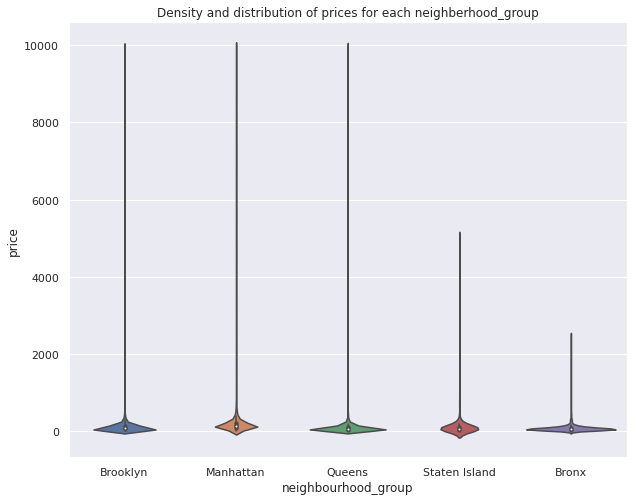

In [ ]:
sns.set(rc={'figure.figsize':(10,8)})
viz_2=sns.violinplot(data=airbnb, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')

*   We need to determine upper limits to get rid of outliers. To do that we need to see some statistical values of the prices in neighbourhood groups. 

In [ ]:
price_list_by_neigh_group= []

for i in neighbourhood_gp:
  sub =airbnb.loc[airbnb['neighbourhood_group'] == i]
  price_sub=sub[['price']]
  price_list_by_neigh_group.append(price_sub)


p_l_b_n_2=[]
#creating list with known values in neighbourhood_group column
#creating a for loop to get statistics for price ranges and append it to our empty list
for x in price_list_by_neigh_group:
    i=x.describe(percentiles=[.25, .50, .75])
    i=i.iloc[3:]
    i.reset_index(inplace=True)
    i.rename(columns={'index':'Stats'}, inplace=True)
    p_l_b_n_2.append(i)
#changing names of the price column to the area name for easier reading of the table   
for i in range(5): 
  p_l_b_n_2[i].rename(columns={'price':neighbourhood_gp[i]}, inplace=True)

#finilizing our dataframe for final view    
stat_df=p_l_b_n_2
stat_df=[df.set_index('Stats') for df in stat_df]
stat_df=stat_df[0].join(stat_df[1:])
stat_df

,Brooklyn,Manhattan,Queens,Staten Island,Bronx
Stats,,,,,
min,0.0,0.0,10.0,13.0,0.0
25%,60.0,95.0,50.0,50.0,45.0
50%,90.0,150.0,75.0,75.0,65.0
75%,150.0,220.0,110.0,110.0,99.0
max,10000.0,10000.0,10000.0,5000.0,2500.0


*   As it can be seen most of the rooms prices are smaller than 250 \$ per night. However, we have extereme values such as 10000 \$ per night. For this reason, choosing 500 $ as an upper limit price for a room would be decent. 
*   The graph shows that our choice was wisely.
*   And also, the houses in Manhattan are more expensive then others. Therefore, as it can be seen that the price of the rooms depends on the locations and their features.   

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

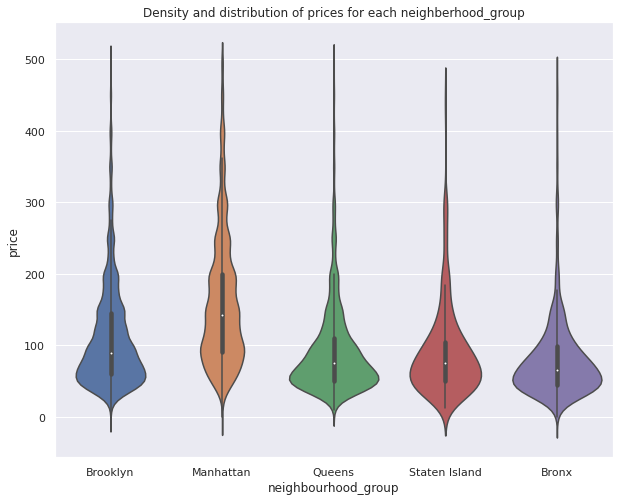

In [ ]:
subairbnb = airbnb[airbnb.price < 500]

viz_2=sns.violinplot(data=subairbnb, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')

*   Let's investigate top 10 hosts that get most reviews. 

In [ ]:
top_reviewed_listings=airbnb.nlargest(10,'number_of_reviews')
top_reviewed_listings

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,47621202,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,14.58,2,333
2031,903972,4734398,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,7.75,3,293
2030,903947,4734398,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,7.72,3,342
2015,891117,4734398,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,7.57,3,339
13495,10101135,47621202,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,13.40,2,173
10623,8168619,37312959,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,11.59,5,163
1879,834190,2369681,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,6.95,1,179
20403,16276632,26432133,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,16.22,5,341
4870,3474320,12949460,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,8.14,1,269
471,166172,792159,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,6.70,1,0



*   Most of the reviews are taken by in 3 neighbourhood groups below. 


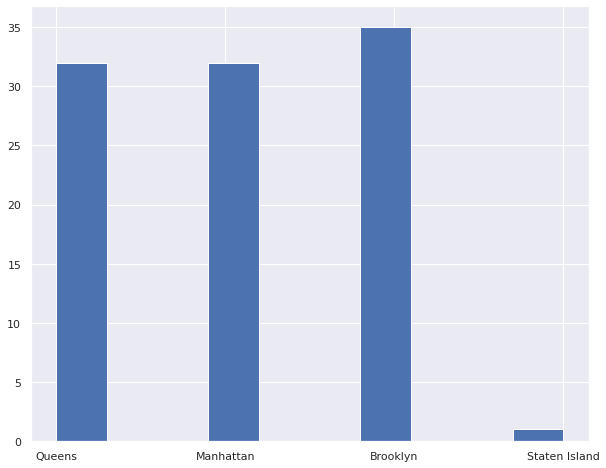

In [ ]:
top_reviewed100=airbnb.nlargest(100,'number_of_reviews')
#top_reviewed100_group = top_reviewed100.groupby("neighbourhood_group")
top_reviewed100['neighbourhood_group'].hist()


*   Let see the hosts in the heatmap of NYC.

In [ ]:
import folium
from folium.plugins import HeatMap
LOCations = {}
for i in airbnb.index:
  start_latitute = airbnb["latitude"][i]
  start_longitude = airbnb["longitude"][i]

  startlist = (start_latitute,start_longitude)
  if startlist not in LOCations.keys():
    LOCations[startlist] = 1
  else:
    LOCations[startlist] +=1

location_map = folium.Map(location=[start_latitute, start_longitude], zoom_start=12, width=1250, height=1000, tiles = "Stamen Terrain")

HeatMap(LOCations).add_to(location_map)

location_map

*   In that scatterplot we want to see which locations have mosts expensive Airbnb rooms.
*   Apparently, the rooms which their prices are above 450 $ mostly, accumulated in the south parth of the city. But also, these kind of accummulations can be seen in some locations. Besides, some locations are relatively more pink than other places.  


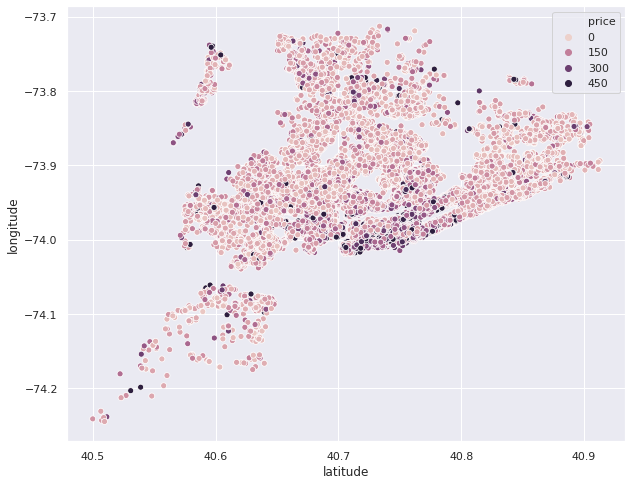

In [ ]:
sns.scatterplot(data=airbnb, x='latitude' , y= 'longitude' , hue='price',hue_norm=(0,400))  

*   In that graph we want see what percentages of the host are in which neighbourhood group.

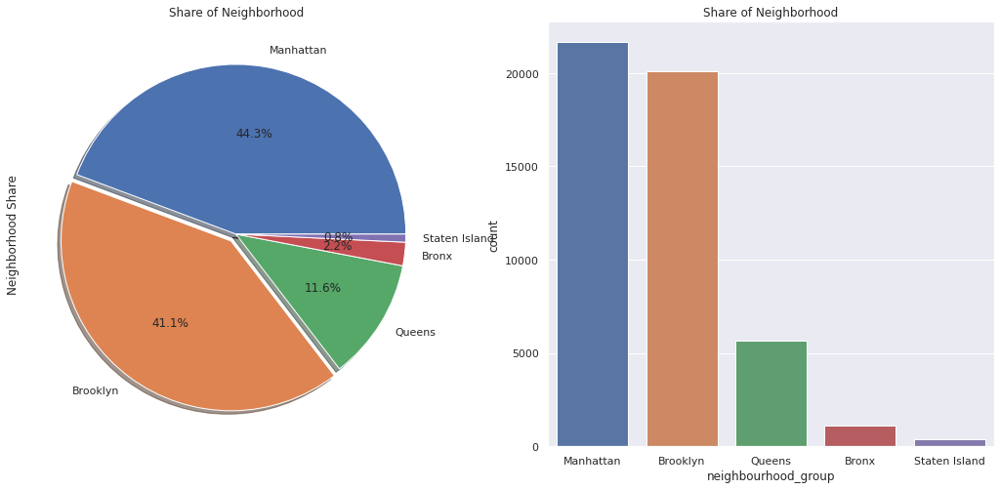

In [ ]:
f,ax=plt.subplots(1,2,figsize=(18,8))
airbnb['neighbourhood_group'].value_counts().plot.pie(explode=[0,0.05,0,0,0],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('Share of Neighborhood')
ax[0].set_ylabel('Neighborhood Share')
sns.countplot('neighbourhood_group',data=airbnb,ax=ax[1],order=airbnb['neighbourhood_group'].value_counts().index)
ax[1].set_title('Share of Neighborhood')
plt.show()

*   As it can be seen in the correlation table, there is no meaningful correlation.

In [ ]:
airbnb.corr().style.background_gradient(cmap='coolwarm')

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1.000000,0.588290,-0.003125,0.090908,0.010619,-0.013224,-0.319760,0.180221,0.133272,0.085468
host_id,0.588290,1.000000,0.020224,0.127055,0.015309,-0.017364,-0.140106,0.209783,0.154950,0.203492
latitude,-0.003125,0.020224,1.000000,0.084788,0.033939,0.024869,-0.015389,-0.018758,0.019517,-0.010983
longitude,0.090908,0.127055,0.084788,1.000000,-0.150019,-0.062747,0.059094,0.138516,-0.114713,0.082731
price,0.010619,0.015309,0.033939,-0.150019,1.000000,0.042799,-0.047954,-0.050564,0.057472,0.081829
minimum_nights,-0.013224,-0.017364,0.024869,-0.062747,0.042799,1.000000,-0.080116,-0.124905,0.127960,0.144303
number_of_reviews,-0.319760,-0.140106,-0.015389,0.059094,-0.047954,-0.080116,1.000000,0.589407,-0.072376,0.172028
reviews_per_month,0.180221,0.209783,-0.018758,0.138516,-0.050564,-0.124905,0.589407,1.000000,-0.047312,0.163732
calculated_host_listings_count,0.133272,0.154950,0.019517,-0.114713,0.057472,0.127960,-0.072376,-0.047312,1.000000,0.225701
availability_365,0.085468,0.203492,-0.010983,0.082731,0.081829,0.144303,0.172028,0.163732,0.225701,1.000000


##BUS STOP SHELTER'S OF NYC
###In that part we explore the NYC Bus Stop Shelter's Dataset. 

*   We get the head of the data to see what kind of data we are dealing with.

In [ ]:
bus_stop.head(5)

,CounDist,BoroCD,AssemDist,the_geom,CongDist,StSenDist,SHELTER_ID,LOCATION,AT_BETWEEN,LONGITUDE,LATITUDE,AssetID,BoroCode,BoroName,Street,SegmentID,PhysicalID,NODEID
0,34,301,53,POINT (-73.94783099999995 40.70681200000007),7,18,BR0003,MONTROSE AV,LORIMER ST,-73.947831,40.706812,1,3,Brooklyn,MONTROSE AVENUE,31244.0,91546,0
1,34,301,50,POINT (-73.94516199999998 40.71909700000003),12,18,BR0014,GRAHAM AV,HERBERT ST,-73.945162,40.719097,2,3,Brooklyn,GRAHAM AVENUE,35598.0,45754,0
2,34,301,53,POINT (-73.94578299999995 40.702976000000035),7,18,BR0026,BROADWAY,LEONARD ST,-73.945783,40.702976,3,3,Brooklyn,BROADWAY,31350.0,43972,19920
3,34,301,50,POINT (-73.94083599999993 40.72019500000005),12,18,BR0028,KINGSLAND AV,HERBERT ST,-73.940836,40.720195,4,3,Brooklyn,KINGSLAND AVENUE,65844.0,48893,40551
4,35,302,50,POINT (-73.96979499999998 40.69344000000007),8,25,BR0040,VANDERBILT AV,MYRTLE AV,-73.969795,40.693440,5,3,Brooklyn,VANDERBILT AVENUE,30196.0,60512,0


*   Since we have 708 unique neighbourhood in that data and 221 unique neighbourhood in the Airbnb dataset to comparing both data in terms of neighbourhood could NOT BE A WISE choice.

In [ ]:
uniq_neighbourhood = bus_stop.LOCATION.unique()
print(len(uniq_neighbourhood))

708




*   We look at the data types of the columns to see the types.


In [ ]:
print(len(bus_stop))
bus_stop.dtypes


3428


CounDist        int64
BoroCD          int64
AssemDist       int64
the_geom       object
CongDist        int64
StSenDist       int64
SHELTER_ID     object
LOCATION       object
AT_BETWEEN     object
LONGITUDE     float64
LATITUDE      float64
AssetID         int64
BoroCode        int64
BoroName       object
Street         object
SegmentID     float64
PhysicalID      int64
NODEID          int64
dtype: object

*   We are very lucky that, we do not have null values on the columns that we will be mostly used.
*   Since our dataset has not to many rows, we do not need to delete any columns in that dataset.

In [ ]:
bus_stop.isnull().sum()#null values

CounDist      0
BoroCD        0
AssemDist     0
the_geom      0
CongDist      0
StSenDist     0
SHELTER_ID    0
LOCATION      0
AT_BETWEEN    0
LONGITUDE     0
LATITUDE      0
AssetID       0
BoroCode      0
BoroName      0
Street        4
SegmentID     4
PhysicalID    0
NODEID        0
dtype: int64

*   Let see the bus stops of the NYC in the map.



In [ ]:
# your solution
import folium
LOC = []
for i in bus_stop.index:
  start_latitute = bus_stop["LATITUDE"][i]
  start_longitude = bus_stop["LONGITUDE"][i]
  startlist = (start_latitute,start_longitude)
  if(startlist not in LOC):
    LOC.append(startlist)

mLatitude = bus_stop["LATITUDE"].mean()
mLongtitude = bus_stop["LONGITUDE"].mean()

mappp = folium.Map(location=[mLatitude,mLongtitude],zoom_start=11,prefer_canvas= True)

for location in LOC:
  folium.CircleMarker([location[0],location[1]],radius= 2, fill=True,fill_color='#3000cc',color='#3000cc').add_to(mappp)
mappp

##SUBWAY ENTRANCE OF NYC
###In that part we explore the NYC Subway Entrance Dataset. Although, this dataset belongs to 2010, as we search from the internet there was no extereme subway station changes in NYC. 

*   We get the head of the dataset and how many rows the dataset has to see what kind of data we are dealing with.

In [ ]:
print(len(subway_enterence))
subway_enterence.head()

1928


,OBJECTID,URL,NAME,the_geom,LINE
0,1734,http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NW corner,POINT (-73.86835600032798 40.84916900104506),2-5
1,1735,http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NE corner,POINT (-73.86821300022677 40.84912800131844),2-5
2,1736,http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,POINT (-73.87349900050798 40.84122300105249),2-5
3,1737,http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,POINT (-73.8728919997833 40.84145300067447),2-5
4,1738,http://web.mta.info/nyct/service/,Boston Rd & 178th St at SW corner,POINT (-73.87962300013866 40.84081500075867),2-5




*   Let's extract the coordinates of the subway enterence form the_ geom column. After that let's create two columns for latitude and longitude values.


In [ ]:
def latGiver(row):
  coord = row['the_geom'].split()
  lat = coord[1][1:]

  return float(lat)

def lonGiver(row):
  coord = row['the_geom'].split()

  lon = coord[2][:-1]
  return  float(lon)

subway_enterence["latitude"] = subway_enterence.apply(lonGiver, axis =1)
subway_enterence["longitude"] = subway_enterence.apply(latGiver, axis =1)
subway_enterence.head()



,OBJECTID,URL,NAME,the_geom,LINE,latitude,longitude
0,1734,http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NW corner,POINT (-73.86835600032798 40.84916900104506),2-5,40.849169,-73.868356
1,1735,http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NE corner,POINT (-73.86821300022677 40.84912800131844),2-5,40.849128,-73.868213
2,1736,http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,POINT (-73.87349900050798 40.84122300105249),2-5,40.841223,-73.873499
3,1737,http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,POINT (-73.8728919997833 40.84145300067447),2-5,40.841453,-73.872892
4,1738,http://web.mta.info/nyct/service/,Boston Rd & 178th St at SW corner,POINT (-73.87962300013866 40.84081500075867),2-5,40.840815,-73.879623




*   We look at the data types of the columns to see the types.



In [ ]:
subway_enterence.dtypes

OBJECTID       int64
URL           object
NAME          object
the_geom      object
LINE          object
latitude     float64
longitude    float64
dtype: object

*   Null values can be seen below. Since, we just need locations of the subway entrances we do not need to deal with null values. Also, we do not need to delete any columns due to we have small dataset.
*   List item

In [ ]:
subway_enterence.isnull().sum()#null values

OBJECTID      0
URL           0
NAME         29
the_geom      0
LINE          0
latitude      0
longitude     0
dtype: int64

*   Let see the subway enterence of the NYC in the map.



In [ ]:
import folium
LOC = []
for i in subway_enterence.index:
  start_latitute = subway_enterence["latitude"][i]
  start_longitude = subway_enterence["longitude"][i]
  startlist = (start_latitute,start_longitude)
  if(startlist not in LOC):
    LOC.append(startlist)

mLatitude = subway_enterence["latitude"].mean()
mLongtitude = subway_enterence["longitude"].mean()

mappp = folium.Map(location=[mLatitude,mLongtitude],zoom_start=11,prefer_canvas= True)

for location in LOC:
  folium.CircleMarker([location[0],location[1]],radius= 2, fill=True,fill_color='#3000cc',color='#3000cc').add_to(mappp)
mappp

##COMBINING PART
###In that part we will be combine the datasets. As it can be seen below we will search for all host houses in that square region below. We will find how many bus stops or subway enterences near that houses.
*   After that we will analyze our results to see if there is a relation between bus stops counts , subway stations counts of an airbnb and its price. 
*   And we will see if there is any correlation between if a house is near a bus stop or a subway entrance or not.




![displaying images](https://drive.google.com/uc?id=1Okg_tGf5L8bsE8fSkXMglI5IiFea7jAI)


###AIRBNB AND BUS STOP COMBINING DATA



*   Below, we will find the bus stops count of each houses in a determined range.   

*   Do not try to run that part, it takes 38 minutes approximately.





In [ ]:
lat1= []
lat2= []
longt1 = []
longt2 = []

for i in airbnb.index:
  lat1.append(airbnb["latitude"][i]-0.002)
  lat2.append(airbnb["latitude"][i]+0.002)
  longt1.append(airbnb["longitude"][i]-0.002)
  longt2.append(airbnb["longitude"][i]+0.002)

numof_stat = []

for i in range(len(lat1)):
  numm=0
  for k in bus_stop.index:
    if((lat1[i]<   bus_stop["LATITUDE"][k]  < lat2[i]) and  (longt1[i]<   bus_stop["LONGITUDE"][k]  < longt2[i]) ):
       numm+=1
  numof_stat.append(numm)



*   Bus stops counts can be seen below as a new column of the main Airbnb dataset.


In [ ]:
print(len(numof_stat))
airbnb["bus_stat_counts"] = numof_stat
airbnb.head(5)

48895


,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,bus_stat_counts
0,2539,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365,1
1,2595,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355,2
2,3647,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365,0
3,3831,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194,1
4,5022,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,4


In [ ]:
airbnb.to_csv("/content/drive/My Drive/cs210proj/airbnb_with_bus_stat_count.csv")



*   Our test results can be seen as an output of the code block below. 



*   We discarded the outliers that we found in the AirBnb exploration part.


*   If there is a bus station near airbnb the price of the airbnb is  11.32  percent expensive.







In [ ]:
subairbnb= airbnb[airbnb.price  < 500]
df= subairbnb[subairbnb["bus_stat_counts"]==0 ]
print("Mean of price with not bus stop ",df["price"].mean())
df2= subairbnb[subairbnb["bus_stat_counts"]!=0 ]
print("Mean of price with bus stop ",df2["price"].mean())
mean1 = df["price"].mean()
mean2 = df2["price"].mean()
perr = str((mean2-mean1)*100/mean1)
print("If there is a bus stop near airbnb the price of the airbnb is", perr[0:5], " percent expensive.",)

Mean of price with not bus stop  120.75378663694184
Mean of price with bus stop  134.43034342312322
If there is a bus stop near airbnb the price of the airbnb is 11.32  percent expensive.


###AIRBNB AND SUBWAY ENTRANCE COMBINING DATA

*   Below, we will find the subway entrance count of each houses in a determined range.   
*   Do not try to run that part, it takes 23 minutes approximately.

In [ ]:
numof_substat = []

for i in range(len(lat1)):
  numm=0
  for k in subway_enterence.index:
    if((lat1[i]< subway_enterence["latitude"][k]  < lat2[i]) and  (longt1[i]<   subway_enterence["longitude"][k]  < longt2[i]) ):
       numm+=1
  numof_substat.append(numm)



*   Subway entrance counts can be seen below as a new column of the main Airbnb dataset.

In [ ]:
print(len(numof_substat))
airbnb["subway_stat_counts"] = numof_substat
airbnb.head(5)


48895


,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,bus_stat_counts,subway_stat_counts
0,2539,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365,1,0
1,2595,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355,2,11
2,3647,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365,0,0
3,3831,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194,1,0
4,5022,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,4,0


In [ ]:
airbnb.to_csv("/content/drive/My Drive/cs210proj/airbnb_with_subway_entrance_count.csv")

*   Our test results can be seen as an output of the code block below. 


*   We discarded the outliers that we found in the AirBnb exploration part as we did in the AIRBNB AND BUS STOP COMBINING DATA subpart.


*   If there is a subway entrance near airbnb the price of the airbnb is  13.82  percent expensive.

In [ ]:
subairbnb= airbnb[airbnb.price  < 500]
df= subairbnb[subairbnb["subway_stat_counts"]==0 ]
print("Mean of price with not metro station ",df["price"].mean())
df2= subairbnb[subairbnb["subway_stat_counts"]!=0 ]
print("Mean of price with metro station  ",df2["price"].mean())
mean1 = df["price"].mean()
mean2 = df2["price"].mean()
perr = str((mean2-mean1)*100/mean1)
print("If there is a subway entrance near airbnb the price of the airbnb is ", perr[0:5], " percent expensive.",)

Mean of price with not metro station  123.72202791379368
Mean of price with metro station   140.83054594931684
If there is a subway entrance near airbnb the price of the airbnb is  13.82  percent expensive.


###COMBINING ALL OF THE DATASETS

*   Below, we will find the total number of transportation stations for each house in a determined range.   

In [ ]:
totalNumOfStat = []
for i in range(len(numof_stat)):
  totalNumOfStat.append(numof_stat[i] + numof_substat[i])

airbnb["total_stat_counts"] = totalNumOfStat
airbnb.head()

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,bus_stat_counts,subway_stat_counts,total_stat_counts
0,2539,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365,1,0,1
1,2595,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355,2,11,13
2,3647,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365,0,0,0
3,3831,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194,1,0,1
4,5022,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,4,0,4


*   Our test results can be seen as an output of the code block below. 


*   We discarded the outliers that we found in the AirBnb exploration part as we did in the last 2 subparts.


*   If there is a subway entrance or a bus stop near airbnb, the price of the airbnb is  17.75  percent expensive.

In [ ]:
subairbnb= airbnb[airbnb.price  < 500]
df= subairbnb[subairbnb["total_stat_counts"]==0 ]
print("Mean of price with there aren't any metro station or bus stop ",df["price"].mean())
df2= subairbnb[subairbnb["total_stat_counts"]!=0 ]
print("Mean of price with there is at least one metro station or bus stop ",df2["price"].mean())
mean1 = df["price"].mean()
mean2 = df2["price"].mean()
perr = str((mean2-mean1)*100/mean1)
print("If there is a subway entrance or a bus stop near airbnb, the price of the airbnb is ", perr[0:5], " percent expensive.",)

Mean of price with there aren't any metro station or bus stop  114.3171209858103
Mean of price with there is at least one metro station or bus stop  134.61632564685505
If there is a subway entrance or a bus stop near airbnb, the price of the airbnb is  17.75  percent expensive.




*   In the correlation table below also shows that our first assumption that is about number of transportation sites affects the price of the airbnb house is true. The reason behind that could be, if an airbnb house located in central location, since central locations have more transportation feasibility, it is  more expencive than other houses. We will be investigate this assumption in the other half of the project.       

*   In the table below, the correlation coefficent between,
*   price, bus stop counts: 0.063605
*   price, subway entrance counts: 0.204134 
*   price, total public transportation counts: 0.204205


*   Besides, subway entrance counts more effective than bus stops count in terms of airbnb house prices.






In [ ]:
subairbnb.corr().style.background_gradient(cmap='coolwarm')

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,bus_stat_counts,subway_stat_counts,total_stat_counts
id,1.000000,0.586228,-0.004780,0.093859,0.009793,-0.014819,-0.320725,0.180824,0.132589,0.081380,-0.033416,0.028325,0.008114
host_id,0.586228,1.000000,0.018586,0.133559,0.007647,-0.019146,-0.138765,0.211576,0.152363,0.200405,-0.027826,0.043546,0.023747
latitude,-0.004780,0.018586,1.000000,0.086745,0.069784,0.024707,-0.013894,-0.017802,0.019637,-0.013092,0.307686,0.073071,0.209481
longitude,0.093859,0.133559,0.086745,1.000000,-0.295588,-0.064322,0.056878,0.138510,-0.115441,0.090410,-0.136268,-0.230488,-0.261419
price,0.009793,0.007647,0.069784,-0.295588,1.000000,0.029650,-0.045548,-0.047769,0.172318,0.092113,0.063605,0.204134,0.204205
minimum_nights,-0.014819,-0.019146,0.024707,-0.064322,0.029650,1.000000,-0.080302,-0.125271,0.129569,0.145525,0.024455,0.023246,0.031493
number_of_reviews,-0.320725,-0.138765,-0.013894,0.056878,-0.045548,-0.080302,1.000000,0.590527,-0.072485,0.177988,-0.019986,-0.040274,-0.043848
reviews_per_month,0.180824,0.211576,-0.017802,0.138510,-0.047769,-0.125271,0.590527,1.000000,-0.047919,0.169236,-0.046386,-0.027276,-0.045421
calculated_host_listings_count,0.132589,0.152363,0.019637,-0.115441,0.172318,0.129569,-0.072485,-0.047919,1.000000,0.228344,0.000136,0.335144,0.285339
availability_365,0.081380,0.200405,-0.013092,0.090410,0.092113,0.145525,0.177988,0.169236,0.228344,1.000000,-0.042135,0.038136,0.012293



*   Scatter plot below also shows that, our first assumption that is about number of transportation sites affects the price of the airbnb house is true.



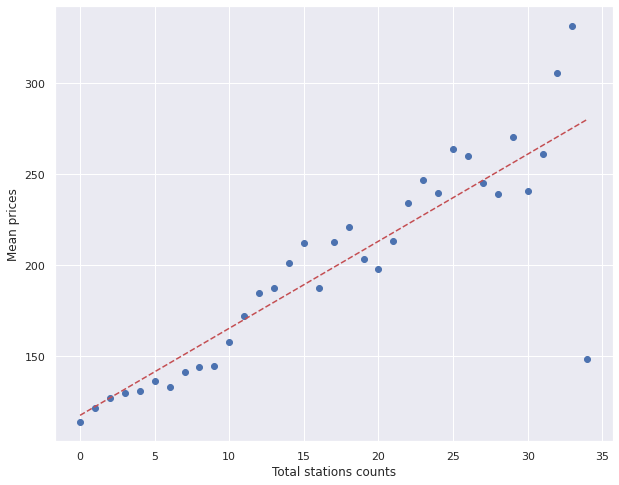

In [ ]:
uniqNumStat= subairbnb.total_stat_counts.unique()

totStatGroup = subairbnb.groupby("total_stat_counts")
priceMeanGroup  = totStatGroup.price.mean()
priceMeanGroup[0]
xarray = range(0, len(priceMeanGroup))


plt.scatter( xarray, priceMeanGroup )
z = np.polyfit(xarray, priceMeanGroup, 1)
p = np.poly1d(z)
plt.plot(xarray,p(xarray),"r--")
plt.ylabel("Mean prices")
plt.xlabel("Total stations counts")
plt.show()

##CONCLUSION \& FUTURE PLANS
###We explored all the datasets to investigate how location have effect on an Airbnb house. After we found that location is matter, we also thought that being close to public transportation services may have effect on an Airbnb houses features. After that, we located all subway entrances and bus stop locations by using other datasets we have. We count the transportation facilities count for each Airbnb house in datasets by looking at their coordinates within a given range of area.  Finally, we calculated the correlations between all features of Airbnb houses with their near public transportation availabilities. By using these calculations we found that occurrence of public transportation station matters on prices and also number of public transportation facilities has positive correlation with prices.

###For the next part of the project we will try to investigate the effects of public transportation counts on other features of Airbnb houses. Combining the features that we added to the dataset, we can also try to create a price predictor model which may have higher accuracy than only raw data itself. We may also try to change the range of the area that we use for counting to improve our model. We can also investigate and compare being in the central location matter more or being near to transportation facilities.

#FINAL REPORT

## MACHINE LEARNING MODELS
In that part, we will try to implement **Decision Tree Regression** and **Random Forest Regression** machine learning algorithms because we will try to predict price values of each airbnb houses which have **continuous** values  and also we will try to look at the whether there is an effect of the columns that we add to Dataframe over price predictions. 

### Implementation



* Since execution of progress part takes aproximately 1 hour, we wrote our last dataframe, that created in progress report, into the new csv file. In below we are reading that csv file and convert into dataframe. Also, after reading the file we get rid of the outliers.

####Data Preparation

In [ ]:
airbnbAll = pd.read_csv(join(path_prefix, "airbnb_with_subway_entrance_count.csv"))
airbnbAll = airbnbAll[airbnbAll.price < 500]
airbnbAll.price.mean()

130.0539026437264

 

*   First lets take the data that we created in the previous parts and reformat it.




In [ ]:
airbnbAll.head()

,Unnamed: 0,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,bus_stat_counts,subway_stat_counts
0,0,2539,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365,1,0
1,1,2595,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355,2,11
2,2,3647,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365,0,0
3,3,3831,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194,1,0
4,4,5022,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,4,0





*   We, will reformat our data inorder to use machine learning algorithm. To do that we will transform necessary columns into numeric values.




In [ ]:
from sklearn.preprocessing import LabelEncoder

lb_make = LabelEncoder()
airbnbAll["neighbourhood_numeric"] = lb_make.fit_transform(airbnbAll["neighbourhood"])
airbnbAll["neighbourhood_group_numeric"] = lb_make.fit_transform(airbnbAll["neighbourhood_group"])
airbnbAll["room_type_numeric"] = lb_make.fit_transform(airbnbAll["room_type"])





*   Now we have the dataset with all values are numeric. We also dropped some columns because we thought that these columns would not have any effect on the results or they would affect the results in a bad way.



In [ ]:
airbnbAll.dtypes
del airbnbAll['Unnamed: 0']
del airbnbAll['id']
del airbnbAll['host_id']
#del airbnbAll['latitude']
#del airbnbAll['longitude']

*   Since we create the numeric values of some columns, we also drop them to ultilize machine learning algorithms over our hypothesis.




In [ ]:
airbnbAll = airbnbAll.drop( ['neighbourhood_group', 'neighbourhood','room_type'], axis =1)

print(airbnbAll.dtypes)
airbnbAll.head(3)


latitude                          float64
longitude                         float64
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
bus_stat_counts                     int64
subway_stat_counts                  int64
neighbourhood_numeric               int64
neighbourhood_group_numeric         int64
room_type_numeric                   int64
dtype: object


,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,bus_stat_counts,subway_stat_counts,neighbourhood_numeric,neighbourhood_group_numeric,room_type_numeric
0,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,107,1,1
1,40.75362,-73.98377,225,1,45,0.38,2,355,2,11,126,2,0
2,40.80902,-73.94190,150,3,0,0.00,1,365,0,0,93,2,1


*   Below, we set our numeric parameters as features and we try to predict price column of the airbnb dataset.



In [ ]:
nyc_features = ['minimum_nights',	'number_of_reviews',	'reviews_per_month',	'calculated_host_listings_count','availability_365', 'bus_stat_counts',	'subway_stat_counts',	'neighbourhood_numeric',	'neighbourhood_group_numeric',	'room_type_numeric']

Y = airbnbAll.price 
X = airbnbAll[nyc_features]

X.head()

,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,bus_stat_counts,subway_stat_counts,neighbourhood_numeric,neighbourhood_group_numeric,room_type_numeric
0,1,9,0.21,6,365,1,0,107,1,1
1,1,45,0.38,2,355,2,11,126,2,0
2,3,0,0.00,1,365,0,0,93,2,1
3,1,270,4.64,1,194,1,0,41,1,0
4,10,9,0.10,1,0,4,0,61,2,0


####Splitting the Data

*   We split our data two parts whose test and train. We train our trained part of data to predict test data. Also, you can see number of datas in the trained and tested part with full dataset below. 



In [ ]:
from sklearn.model_selection import train_test_split
train_X, validation_X, train_Y, validation_Y = train_test_split(X, Y, random_state = 42)
print("Mean and standart deviation of price:", airbnbAll.price.mean(),airbnbAll.price.std() )
print("Training set: Xt:{} Yt:{}".format(train_X.shape, train_Y.shape)) 
print("Validation set: Xv:{} Yv:{}".format(validation_X.shape, validation_Y.shape)) 
print("-") 
print("Full dataset: X:{} Y:{}".format(X.shape, Y.shape))

Mean and standart deviation of price: 130.0539026437264 85.08768408632713
Training set: Xt:(35745, 10) Yt:(35745,)
Validation set: Xv:(11915, 10) Yv:(11915,)
-
Full dataset: X:(47660, 10) Y:(47660,)


*   Since our first machine learning model is Decision Tree Regressor model,we create new model namely nyc_airbnb_model and we can fit our data that will be trained and tested into that model.

In [ ]:
from sklearn.tree import DecisionTreeRegressor

nyc_airbnb_model = DecisionTreeRegressor(random_state = 42) 
nyc_airbnb_model.fit(train_X, train_Y)


DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=42, splitter='best')

*   You can see the head of the data that will be trained.

In [ ]:
train_X.head()

,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,bus_stat_counts,subway_stat_counts,neighbourhood_numeric,neighbourhood_group_numeric,room_type_numeric
36948,2,12,1.91,1,229,0,0,55,4,0
19111,2,30,0.89,13,333,2,1,126,2,1
1213,1,10,0.14,1,0,1,0,213,1,1
30792,30,2,0.16,1,0,3,2,93,2,1
40780,1,1,0.21,2,2,0,0,90,1,0




*   Now, we will make prediction by using our model. After the prediction, to understand how much our predictions accurate, we will look at the mean absolute error which is the arithmetic average of the absolute errors of our prediction and tested data. As it can be seen below, our predictions have approximately 55.14 MAE. After this part we will try to decrease the our error value.



In [ ]:
from sklearn.metrics import mean_absolute_error

# instruct our model to make predictions for the prices on the validation set 
validation_predictions = nyc_airbnb_model.predict(validation_X)

# calculate the MAE between the actual prices (in validation_Y) and the predictions made 
validation_prediction_errors = mean_absolute_error(validation_Y, validation_predictions)

validation_prediction_errors

55.14301254999955

####Hyper Parameter Tuning

*   In that part,since we want to improve our decision tree regression model, we will try to do hyper parameter tuning.Below,we will find in which value of maximum leaf node we will get more accurate (or less MAE) results.

*   It can be seen that best size of maximum leaf node found 100.

In [ ]:
# this function takes both the training and validation sets to compute the MAE for a Decision Tree 
def compute_mae(train_X, train_Y, validation_X, validation_Y, max_leaf_nodes): 
  trees_model = DecisionTreeRegressor(max_leaf_nodes = max_leaf_nodes, random_state = 42) 
  trees_model.fit(train_X, train_Y) 
  validation_predictions = trees_model.predict(validation_X) 
  error = mean_absolute_error(validation_Y, validation_predictions)
  
  return(error)

def get_best_tree_size(train_X, train_Y, validation_X, validation_Y, verbose = False):
  # candidates to iterate on finding a better tree depth  
  candidate_max_leaf_nodes = [5, 10, 20, 30, 50, 100, 250, 500]
  
  # initialization 
  minimum_error = None 
  best_tree_size = 5 
  
  # loop to find the minimal error value 
  for max_leaf_nodes in candidate_max_leaf_nodes: 
    current_error = compute_mae(train_X, train_Y, validation_X, validation_Y, max_leaf_nodes) 
    print("(Size: {}, MAE: {})".format(max_leaf_nodes, current_error)) 
    
    if(minimum_error == None or current_error < minimum_error): 
      minimum_error = current_error 
      best_tree_size = max_leaf_nodes 
     
  return(best_tree_size) 
  
best_tree_size = get_best_tree_size(train_X, train_Y, validation_X, validation_Y, True) 
best_tree_size

(Size: 5, MAE: 46.48595490504474)
(Size: 10, MAE: 44.514270311028696)
(Size: 20, MAE: 43.63112687134056)
(Size: 30, MAE: 43.09904981060551)
(Size: 50, MAE: 42.716494143354005)
(Size: 100, MAE: 41.97030299479622)
(Size: 250, MAE: 42.03159844182155)
(Size: 500, MAE: 42.44581024666511)


100

####Creating a better decision tree regressor

*   Below, we run our model with best number of maximum leaf nodes that we found in previous part. Our new model give us around 42 MAE which is 13 dollar smaller that our previous prediction gave.

In [ ]:
# create the model
nyc_model = DecisionTreeRegressor(max_leaf_nodes = best_tree_size, random_state = 42)
nyc_model.fit(train_X, train_Y)

# generate the predictions for the validation set
validation_predictions = nyc_model.predict(validation_X)
validation_prediction_errors = mean_absolute_error(validation_Y, validation_predictions)

validation_prediction_errors

41.97030299479622

####Testing the parameters that we added

* We simply delete our features about transportation to see whether our parameters are effective or not

In [ ]:
nyc_features_withoutT = ['minimum_nights',	'number_of_reviews',	'reviews_per_month'	,'calculated_host_listings_count','availability_365', 	'neighbourhood_numeric',	'neighbourhood_group_numeric',	'room_type_numeric']

Y_T = airbnbAll.price 
X_T = airbnbAll[nyc_features_withoutT]
train_X_T, validation_X_T, train_Y_T, validation_Y_T = train_test_split(X_T, Y_T, random_state = 42)
best_tree_size = get_best_tree_size(train_X_T, train_Y_T, validation_X_T, validation_Y_T, True) 
best_tree_size

(Size: 5, MAE: 46.48595490504474)
(Size: 10, MAE: 44.514270311028696)
(Size: 20, MAE: 43.84183974579377)
(Size: 30, MAE: 43.423148545834756)
(Size: 50, MAE: 42.77354676249345)
(Size: 100, MAE: 42.23451824604779)
(Size: 250, MAE: 42.12451816519945)
(Size: 500, MAE: 42.47781365210329)


250

In [ ]:
trees_model = DecisionTreeRegressor( random_state = 42) 
trees_model.fit(train_X_T, train_Y_T) 
validation_predictions_T = trees_model.predict(validation_X_T) 
error = mean_absolute_error(validation_Y_T, validation_predictions_T)
print(error)

53.76034664865496


* Without transformation information we take 42.12 MAE. Therefore, we can say that the parameters that we created positively effect our accuracy result a bit. If we don't give any number to the algorithm about tree size it gives even higher error which is 53.76 MAE.

####Tree Visualization

In [ ]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(nyc_model, out_file='tree.dot', 
                feature_names = nyc_features,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png',height = 500)

####Random Forest Algorithm
* To improve our accuracy (decreasing the MAE), we will use Random Forest Regression Model. Then, we will compare our error value with the decision tree model's error value. 

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

# create copies of our data sets to apply the transformations
train_X_encoded = train_X.copy()
validation_X_encoded = validation_X.copy()


# let us set a maximum of 250 trees in our forest
nyc_forest_model = RandomForestRegressor(n_estimators = 250, random_state = 42,max_leaf_nodes=best_tree_size)
nyc_forest_model.fit(train_X_encoded, train_Y)

predictions = nyc_forest_model.predict(validation_X_encoded)

print(mean_absolute_error(validation_Y, predictions))


nyc_forest_model = RandomForestRegressor(n_estimators = 250, random_state = 42,max_leaf_nodes=best_tree_size)
nyc_forest_model.fit(train_X_T, train_Y_T)

predictions = nyc_forest_model.predict(validation_X_T)

print(mean_absolute_error(validation_Y_T, predictions))


### Results & Discussion

<font color="blue">
  As it can be seen below, the results shows that our parameters are not actually effective to determine the price value as we did not expect during the progress. We thought that the corrrelation between price and near transportation facility counts that we found during progress report means that these values are giving valuable information about airbnb house's prices. 

  However, it can be seen that other parameters are enough to have the same results.
</font>

| Models | Mean Absolute Error Value |
|-------------------|----------------|
|   Decision Tree Regression model        | 55.14 \$        | 
|   DTR model with optimum leaf node count | 42.03 \$         |
|   Random Forest Regression model       | 40.66   \$       |



| Models (without our parameters) | Mean Absolute Error Value |
|-------------------|----------------|
|   Decision Tree Regression model        | 53.76 \$        | 
|   DTR model with optimum leaf node count       | 42.12 \$          |
|   Random Forest Regression model       | 40.67 \$          |

## Conclusion




*   In short, we aimed to find is the location's properties are valuable information or not.
*   Then we decided to evaluate transportation properties of the each Airbnb and we found positive correlation between the nearby facilitity count and Airbnb house prices.


*   Finally, we tried to create a model that can predict price of an Airbnb houses. Because of the nature of our problem, we should pick regression based machine learning algorithms. Therefore, we picked Decision Tree Regression and Random Forest Regression algorithms. 

*   As a result of our models, we found that the information about nearby transportation facilities actually has same value with other properties of an airbnb while predicting the price. In other words, transportation facility count is not giving distinguishable information while predicting an airbnb house price's.
*  However, we think that we found fairly small Mean Absolute Value for predicting the price whose overal mean is 130 dollar.



    

